# Data Measurements 


Processing: phot_00.fits
  Optimal Aperture: 25 px

Processing: phot_01.fits
  Optimal Aperture: 27 px

Processing: phot_02.fits
  Optimal Aperture: 26 px

Processing: phot_03.fits
  Optimal Aperture: 26 px

Processing: phot_04.fits
  Optimal Aperture: 27 px

Processing: phot_05.fits
  Optimal Aperture: 25 px

Processing: phot_06.fits
  Optimal Aperture: 26 px

Processing: phot_07.fits
  Optimal Aperture: 30 px

Processing: phot_08.fits
  Optimal Aperture: 33 px

Processing: phot_09.fits
  Optimal Aperture: 29 px

Processing: phot_10.fits
  Optimal Aperture: 29 px

Processing: phot_11.fits
  Optimal Aperture: 30 px

Processing: phot_12.fits
  Optimal Aperture: 30 px

Processing: phot_13.fits
  Optimal Aperture: 29 px

Processing: phot_14.fits
  Optimal Aperture: 29 px

Processing: phot_15.fits
  Optimal Aperture: 28 px

Processing: phot_16.fits
  Optimal Aperture: 16 px

Processing: phot_17.fits
  Optimal Aperture: 17 px

Processing: phot_00.fits
  Photometry Results:
    Star: nova, 

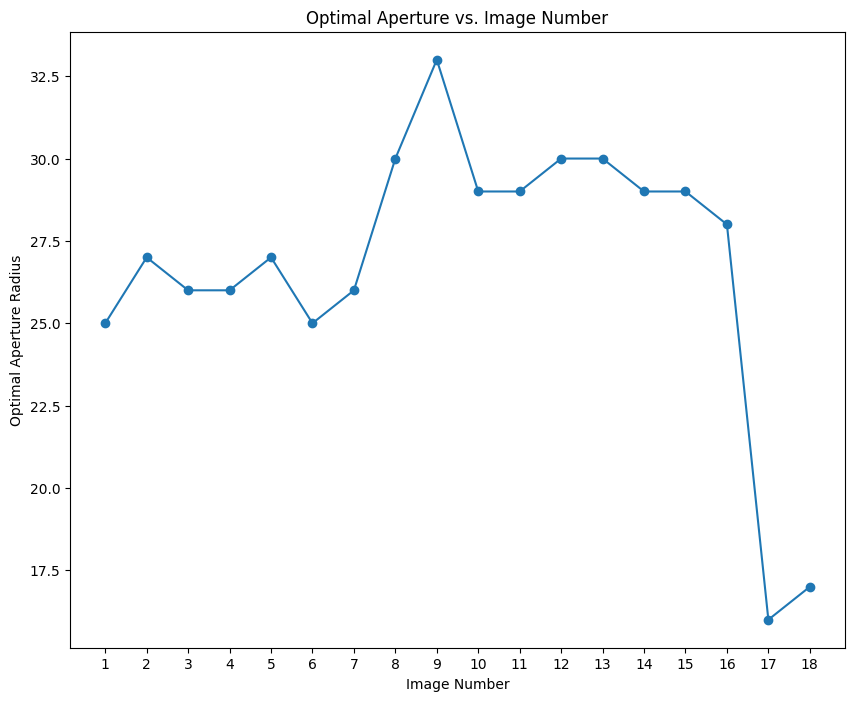


No SIMBAD objects found for Secondary Star at RA: 11.081466, Dec: 40.123586

SIMBAD Query Results for Secondary Star at RA: 11.120590, Dec: 40.205843:
    MAIN_ID            RA           DEC      RA_PREC ... COO_QUAL COO_WAVELENGTH     COO_BIBCODE     SCRIPT_NUMBER_ID
                    "h:m:s"       "d:m:s"            ...                                                             
---------------- ------------- ------------- ------- ... -------- -------------- ------------------- ----------------
UCAC4 652-002852 00 44 28.8936 +40 12 19.514      14 ...        A              O 2020yCat.1350....0G                1

SIMBAD Query Results for Secondary Star at RA: 11.125576, Dec: 40.133292:
        MAIN_ID               RA           DEC      RA_PREC ... COO_WAVELENGTH     COO_BIBCODE     SCRIPT_NUMBER_ID
                           "h:m:s"       "d:m:s"            ...                                                    
----------------------- ------------- ------------- ------- ... -----

In [4]:
import astropy
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.coordinates import SkyCoord
from astropy import units as u
import matplotlib.pyplot as plt
import numpy as np
import os
from photutils.aperture import CircularAperture, CircularAnnulus, aperture_photometry
from astroquery.simbad import Simbad
from astropy.wcs import WCS
import warnings
from astropy.wcs import FITSFixedWarning

warnings.filterwarnings('ignore', category=FITSFixedWarning, message=".*'datfix' made the change.*")

wd = r"C:\Users\friesco\workstation\fr-p\studies\ASTRO716\data_excercise"
plt.rcParams['figure.figsize'] = [10, 8]

def phot_counts(img, nx, ny, ap_rad, in_ann, out_ann):
    ap = CircularAperture((nx, ny), r=ap_rad)
    ann_ap = CircularAnnulus((nx, ny), r_in=in_ann, r_out=out_ann)
    phot_tbl = aperture_photometry(img, [ap, ann_ap])

    ann_mask = ann_ap.to_mask(method='center')
    ann_data = ann_mask.multiply(img)
    bkg_vals = ann_data[ann_mask.data > 0]
    mean, med, std = sigma_clipped_stats(bkg_vals, sigma=3.0)
    bkg_med = med
    bkg_sum = bkg_med * ap.area

    tot_counts = phot_tbl['aperture_sum_0'][0]
    return tot_counts, bkg_sum, ap.area

def calc_snr(tot_counts, bkg_counts, ap_area):
    mean_counts = (tot_counts - bkg_counts) / ap_area
    if tot_counts + bkg_counts <= 0:
        print("Warning: Negative counts. Returning SNR = 0")
        return 0.0
    err_counts = np.sqrt(tot_counts + bkg_counts) / ap_area
    return mean_counts / err_counts

def phot_mag(img, x, y, ap_rad, in_ann, out_ann):
    ap = CircularAperture((x, y), r=ap_rad)
    ann_ap = CircularAnnulus((x, y), r_in=in_ann, r_out=out_ann)
    phot_tbl = aperture_photometry(img, [ap, ann_ap])

    ann_mask = ann_ap.to_mask(method='center')
    ann_data = ann_mask.multiply(img)
    bkg_vals = ann_data[ann_mask.data > 0]
    mean, med, std = sigma_clipped_stats(bkg_vals, sigma=3.0)
    bkg_med = med
    bkg_sum = bkg_med * ap.area

    final_sum = phot_tbl['aperture_sum_0'] - bkg_sum
    if final_sum[0] > 0:
        inst_mag = -2.5 * np.log10(final_sum) + 50
        mag_err = 1.0857 * (np.sqrt(phot_tbl['aperture_sum_0'] + bkg_sum) / phot_tbl['aperture_sum_0'])
    else:
        inst_mag = np.nan
        mag_err = np.nan
    return inst_mag, mag_err, bkg_med

phot_files = [f for f in os.listdir(wd) if f.startswith('phot_') and f.endswith('.fits')]
phot_files.sort()

nx, ny = 1033, 1336
sec_stars = [(820, 165), (1795, 520), (935, 565), (745, 1315), (935, 1020)]
ap_radii_snr = np.arange(5, 40, 1)
in_ann, out_ann = 25, 35
opt_ap = []

for i, f in enumerate(phot_files):
    path = os.path.join(wd, f)
    with fits.open(path) as hdu:
        img = hdu[0].data
        hdr = hdu[0].header
        if img.dtype.byteorder == '>':
            img = img.byteswap().view(img.dtype.newbyteorder('<'))

    print(f"\nProcessing: {f}")
    snrs = []
    for ap_rad in ap_radii_snr:
        tot_counts, bkg_counts, ap_area = phot_counts(img, nx, ny, ap_rad, in_ann, out_ann)
        if tot_counts + bkg_counts <= 0:
            print(f"Warning: Negative counts in {f}, aperture: {ap_rad}")
            snrs.append(0.0)
        else:
            snr = calc_snr(tot_counts, bkg_counts, ap_area)
            snrs.append(snr)

    opt_ap_rad = ap_radii_snr[np.argmax(snrs)]
    opt_ap.append(opt_ap_rad)
    print(f"  Optimal Aperture: {opt_ap_rad} px")

for i, f in enumerate(phot_files):
    path = os.path.join(wd, f)
    with fits.open(path) as hdu:
        img = hdu[0].data
        hdr = hdu[0].header
        if img.dtype.byteorder == '>':
            img = img.byteswap().view(img.dtype.newbyteorder('<'))

    print(f"\nProcessing: {f}")
    opt_ap_rad = opt_ap[i]

    results = []
    for st_type, x, y in [('nova', nx, ny)] + [('sec_star', x, y) for x, y in sec_stars]:
        inst_mag, mag_err, bkg_med = phot_mag(img, x, y, opt_ap_rad, in_ann, out_ann)
        wcs = WCS(hdr)
        ra, dec = wcs.pixel_to_world_values(x, y)

        results.append({
            'img': f,
            'st_type': st_type,
            'x': x,
            'y': y,
            'ra': ra,
            'dec': dec,
            'opt_ap': opt_ap_rad,
            'inst_mag': inst_mag,
            'mag_err': mag_err,
            'bkg': bkg_med,
            'mjd': hdr['MJD']
        })

    print("  Photometry Results:")
    for r in results:
        print(f"    Star: {r['st_type']}, x: {r['x']}, y: {r['y']}, RA: {r['ra']:.6f}, Dec: {r['dec']:.6f}, "
              f"Inst. Mag: {r['inst_mag'] if np.isfinite(r['inst_mag']) else 'NaN'}, "
              f"Mag Err: {r['mag_err'] if np.isfinite(r['mag_err']) else 'NaN'}, "
              f"Sky Bkg: {r['bkg']:.3f}, Opt. Ap: {r['opt_ap']}, MJD: {r['mjd']:.5f}")

print("\nOptimal Aperture Radii:", opt_ap)
plt.figure()
plt.plot(range(1, len(phot_files) + 1), opt_ap, 'o-')
plt.xlabel("Image Number")
plt.ylabel("Optimal Aperture Radius")
plt.title("Optimal Aperture vs. Image Number")
plt.xticks(range(1, len(phot_files) + 1))
plt.show()

for st in results:
    if st['st_type'] == 'sec_star':
        coord = SkyCoord(ra=st['ra'], dec=st['dec'], unit=(u.deg, u.deg), frame='icrs')
        res_tbl = Simbad.query_region(coord, radius=0.01 * u.deg)
        if res_tbl is not None and len(res_tbl) > 0:
            print(f"\nSIMBAD Query Results for Secondary Star at RA: {st['ra']:.6f}, Dec: {st['dec']:.6f}:")
            print(res_tbl)
        else:
            print(f"\nNo SIMBAD objects found for Secondary Star at RA: {st['ra']:.6f}, Dec: {st['dec']:.6f}")


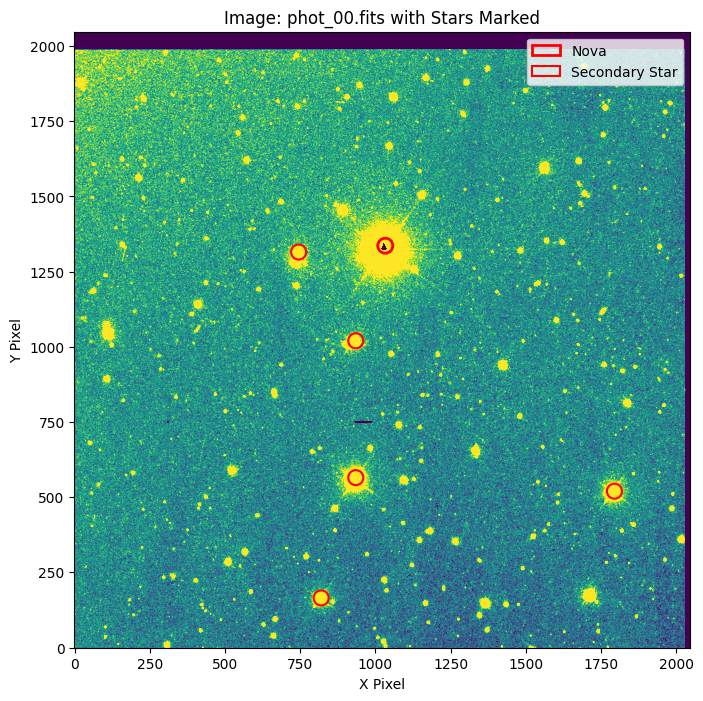

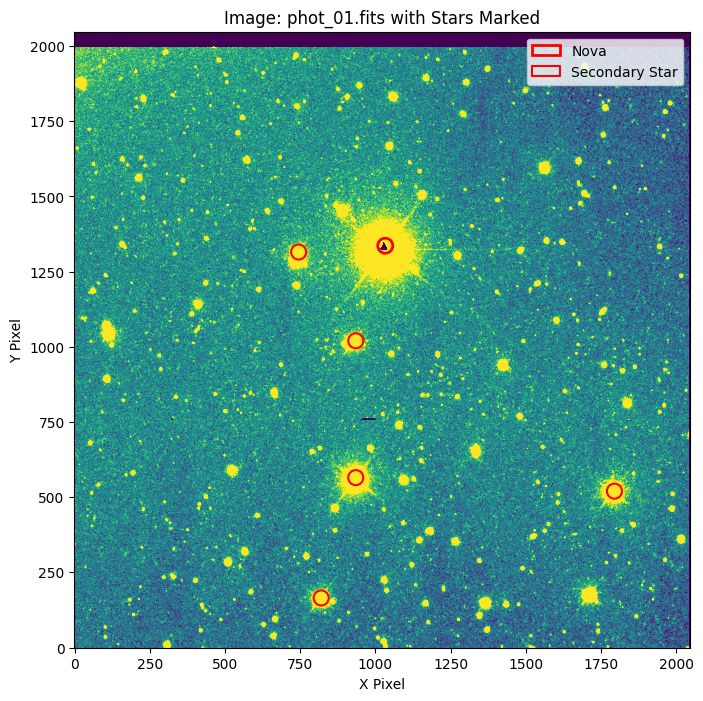

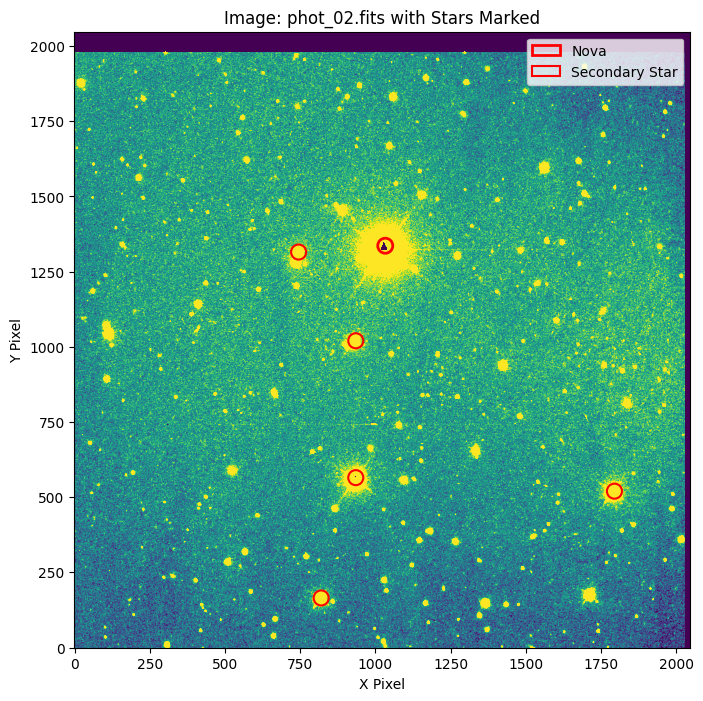

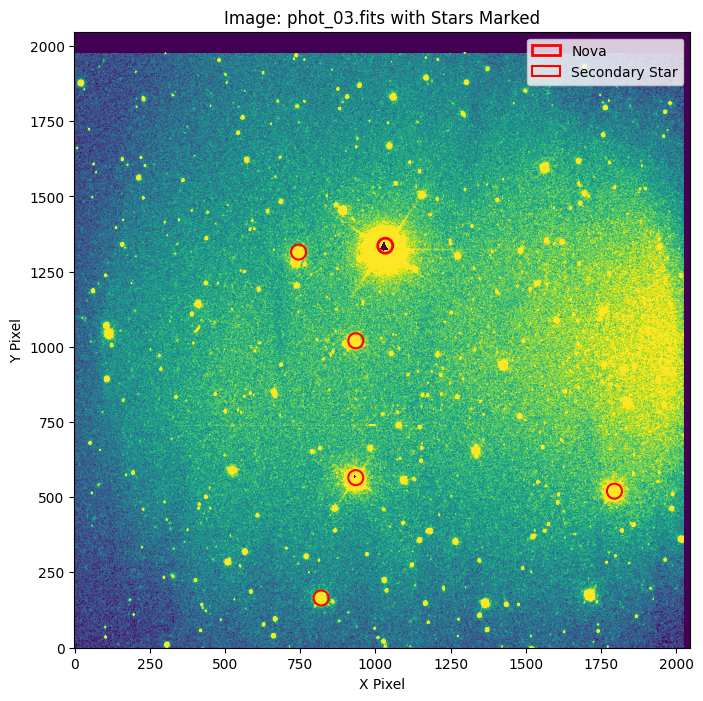

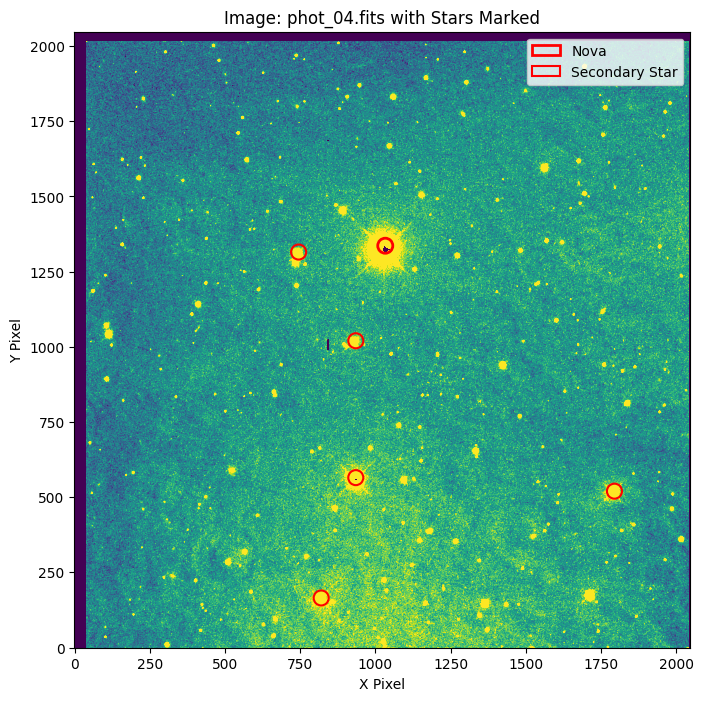

...

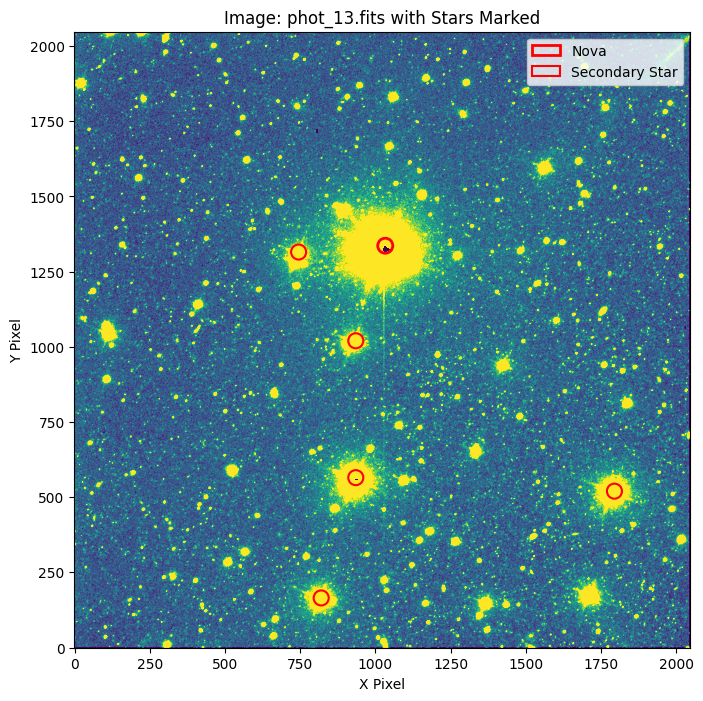

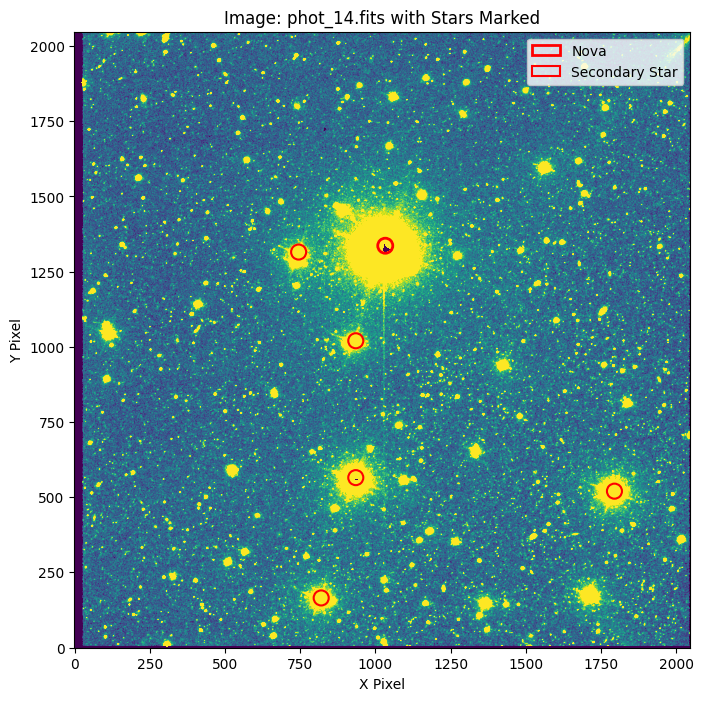

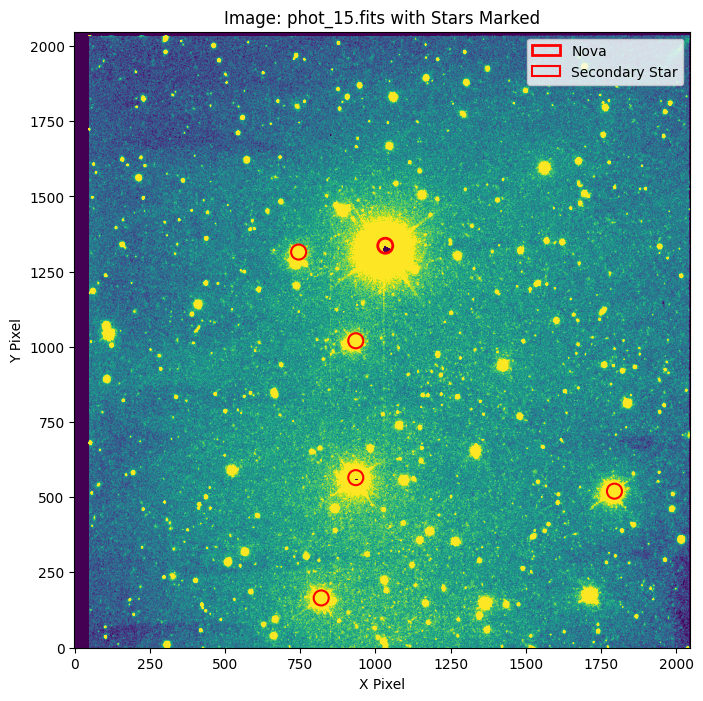

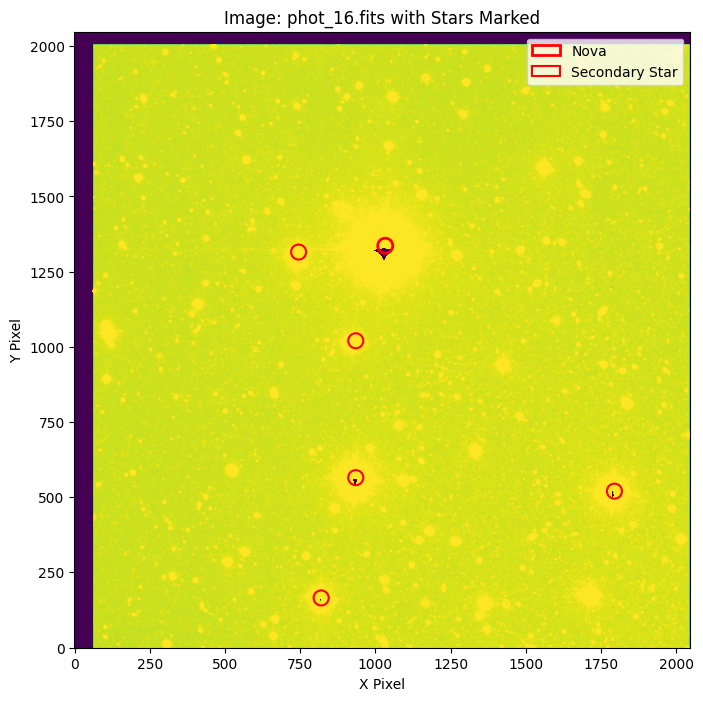

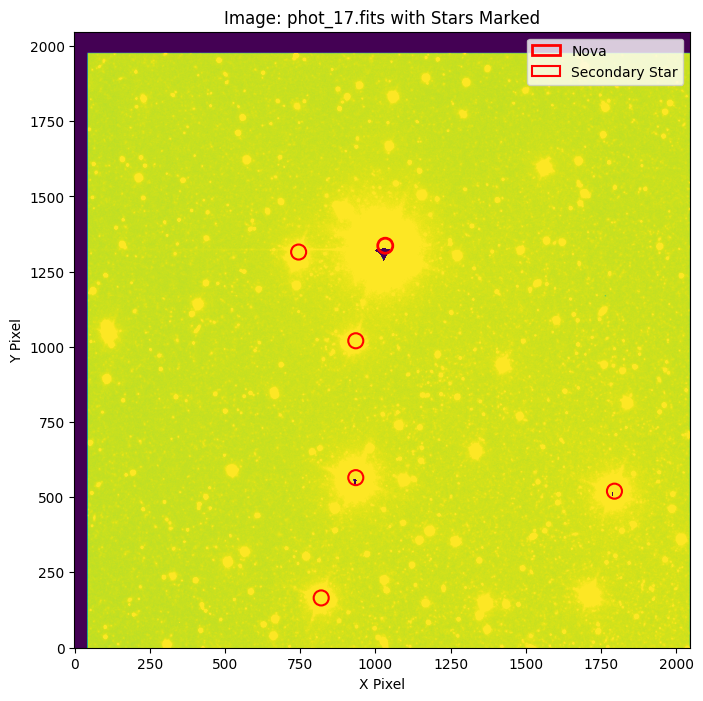

In [5]:
import astropy
from astropy.io import fits
import matplotlib.pyplot as plt
import numpy as np
import os
from photutils.aperture import CircularAperture
from astropy.wcs import WCS
import warnings
from astropy.wcs import FITSFixedWarning

warnings.filterwarnings('ignore', category=FITSFixedWarning, message=".*'datfix' made the change.*")

wd = r"C:\Users\friesco\workstation\fr-p\studies\ASTRO716\data_excercise"
plt.rcParams['figure.figsize'] = [10, 8]

phot_files = [f for f in os.listdir(wd) if f.startswith('phot_') and f.endswith('.fits')]
phot_files.sort()

nx, ny = 1033, 1336

sec_stars = [(820, 165), (1795, 520), (935, 565), (745, 1315), (935, 1020)]

for i, f in enumerate(phot_files):
    path = os.path.join(wd, f)
    with fits.open(path) as hdu:
        img = hdu[0].data
        if img.dtype.byteorder == '>':
            img = img.byteswap().view(img.dtype.newbyteorder('<'))

    fig, ax = plt.subplots()
    plt.imshow(img, origin='lower', cmap='viridis', vmin=np.percentile(img, 5), vmax=np.percentile(img, 95))

    ap_nova = CircularAperture((nx, ny), r=25)
    ap_nova.plot(color='red', lw=2, label='Nova')

    for x, y in sec_stars:
        ap_sec = CircularAperture((x, y), r=25)
        ap_sec.plot(color='red', lw=1.5, label='Secondary Star')

    plt.title(f'Image: {f} with Stars Marked')
    plt.xlabel('X Pixel')
    plt.ylabel('Y Pixel')

    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(), loc='upper right')

    plt.show()
